In [30]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# TP1 - Panorámica

In [31]:
import cv2
import matplotlib.pyplot as plt

from utils import *

## 3.1 - Detección y descripción de características visuales


Imagen: img/cuadro_0.jpg


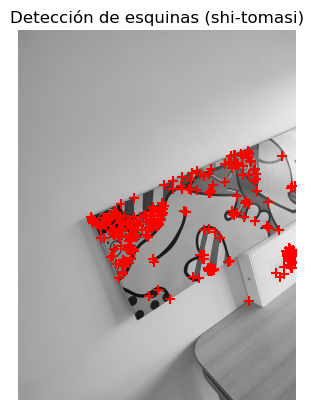

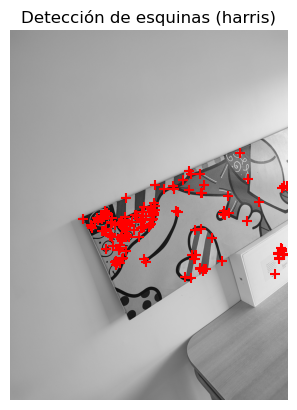


Imagen: img/cuadro_1.jpg


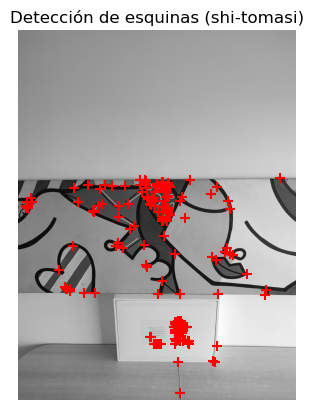

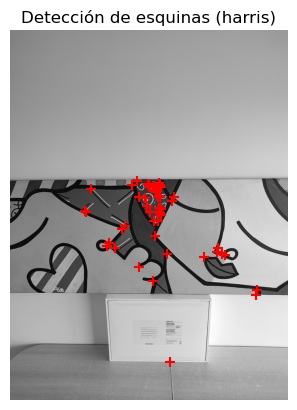


Imagen: img/cuadro_2.jpg


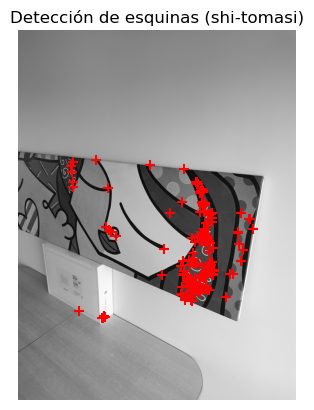

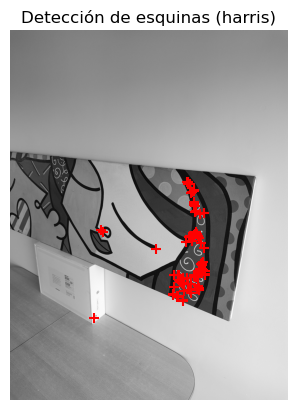

In [ ]:
pathsC = ["img/cuadro_0.jpg", "img/cuadro_1.jpg", "img/cuadro_2.jpg"]

for path in pathsC:
    img = cv2.imread(path)
    if img is None:
        print(f"No se pudo leer {path}")
        continue

    print(f"\nImagen: {path}")
    plot_corners(img, method='shi-tomasi', maxCorners=800, qualityLevel=0.2, minDistance=8)
    plot_corners(img, method='harris', maxCorners=800, qualityLevel=0.2, minDistance=8)


Imagen: img/udesa_0.jpg


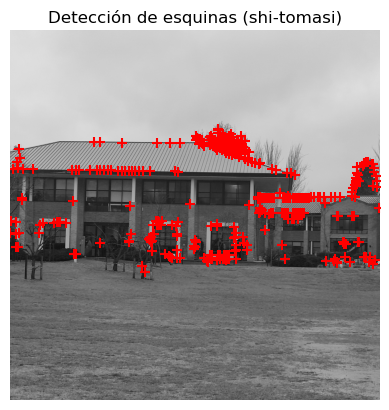

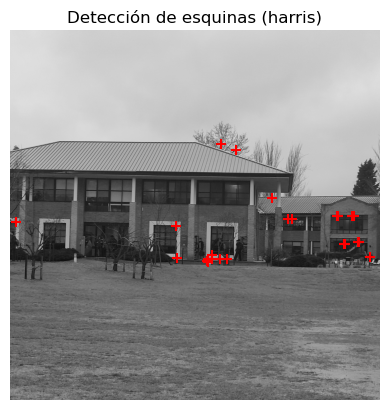


Imagen: img/udesa_1.jpg


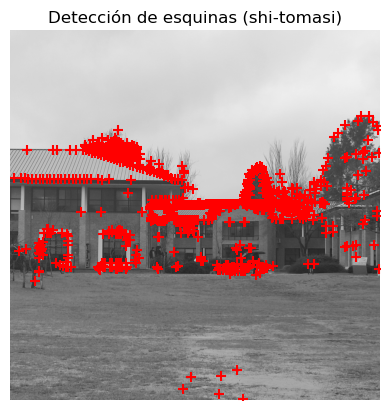

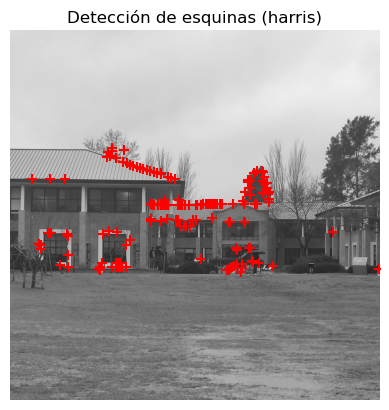


Imagen: img/udesa_2.jpg


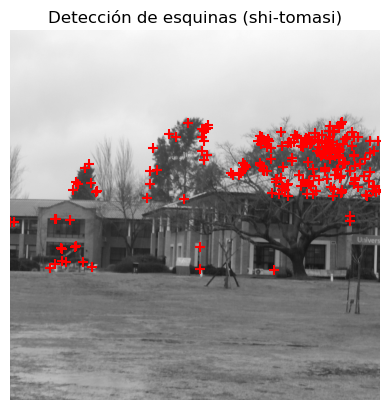

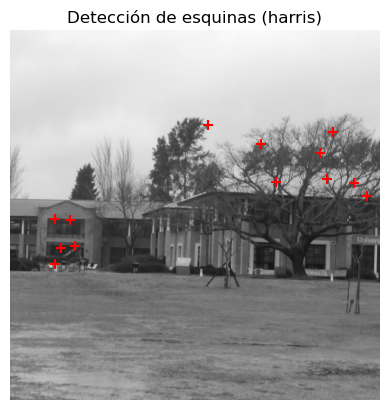

In [35]:
pathsU = ["img/udesa_0.jpg", "img/udesa_1.jpg", "img/udesa_2.jpg"]

for path in pathsU:
    img = cv2.imread(path)
    if img is None:
        print(f"No se pudo leer {path}")
        continue

    print(f"\nImagen: {path}")
    plot_corners(img, method='shi-tomasi', maxCorners=800, qualityLevel=0.2, minDistance=8)
    plot_corners(img, method='harris', maxCorners=800, qualityLevel=0.2, minDistance=8)


Imagen: img/cuadro_0.jpg
Cantidad de keypoints detectados: 13636
Dimensión de cada descriptor: (13636, 128)


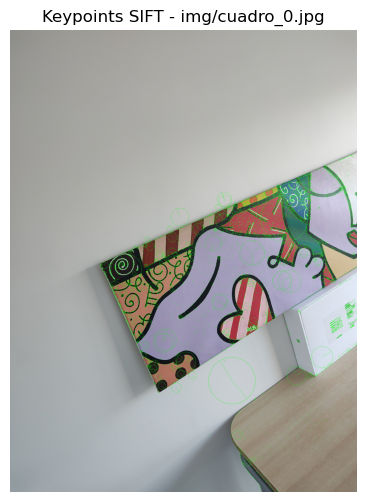


Imagen: img/cuadro_1.jpg
Cantidad de keypoints detectados: 15151
Dimensión de cada descriptor: (15151, 128)


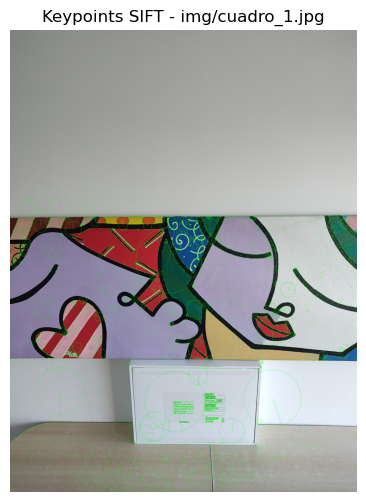


Imagen: img/cuadro_2.jpg
Cantidad de keypoints detectados: 13947
Dimensión de cada descriptor: (13947, 128)


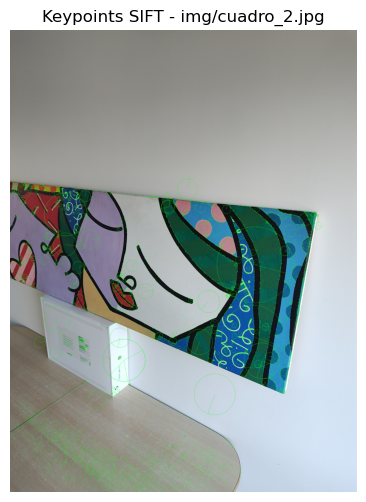

In [4]:
pathsC = ["img/cuadro_0.jpg", "img/cuadro_1.jpg", "img/cuadro_2.jpg"]
sift = cv2.SIFT_create()

for path in pathsC:
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    keypoints, descriptors = sift.detectAndCompute(gray, None)

    print(f"\nImagen: {path}")
    print("Cantidad de keypoints detectados:", len(keypoints))
    print("Dimensión de cada descriptor:", descriptors.shape)

    img_kp = cv2.drawKeypoints(
        img, keypoints, None,
        color=(0,255,0),
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )

    plt.figure(figsize=(8,6))
    plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(f"Keypoints SIFT - {path}")
    plt.show()


Imagen: img/udesa_0.jpg
Cantidad de keypoints detectados: 22105
Dimensión de cada descriptor: (22105, 128)


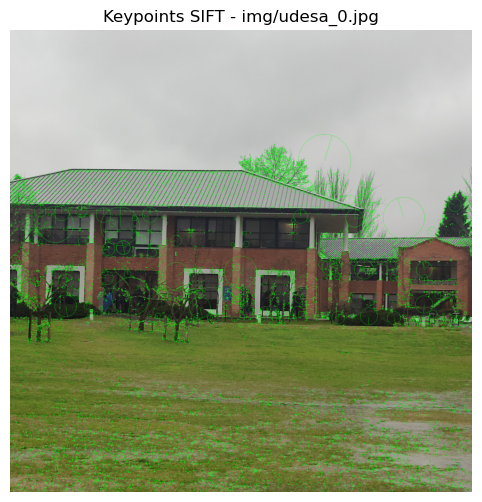


Imagen: img/udesa_1.jpg
Cantidad de keypoints detectados: 14851
Dimensión de cada descriptor: (14851, 128)


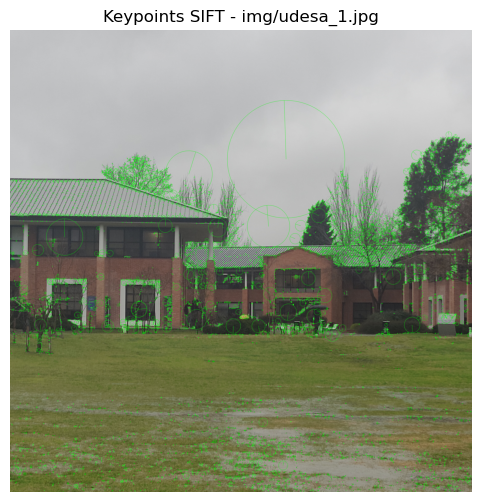


Imagen: img/udesa_2.jpg
Cantidad de keypoints detectados: 5364
Dimensión de cada descriptor: (5364, 128)


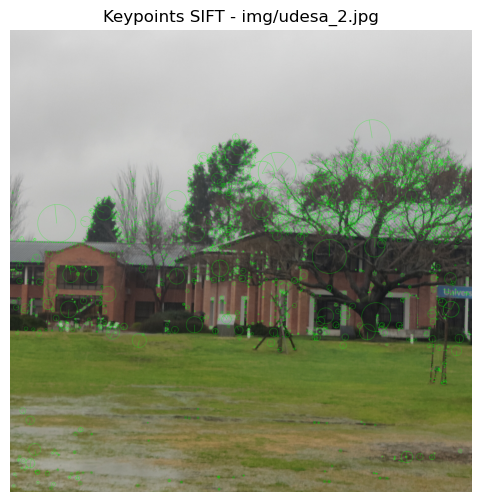

In [5]:
pathsU = ["img/udesa_0.jpg", "img/udesa_1.jpg", "img/udesa_2.jpg"]
sift = cv2.SIFT_create()

for path in pathsU:
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    keypoints, descriptors = sift.detectAndCompute(gray, None)

    print(f"\nImagen: {path}")
    print("Cantidad de keypoints detectados:", len(keypoints))
    print("Dimensión de cada descriptor:", descriptors.shape)

    img_kp = cv2.drawKeypoints(
        img, keypoints, None,
        color=(0,255,0),
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )

    plt.figure(figsize=(8,6))
    plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(f"Keypoints SIFT - {path}")
    plt.show()

## 3.2 - Supresión de No Máxima Adaptativa

In [6]:
for path in pathsC:
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kps, desc = sift.detectAndCompute(gray, None)

    N = 900
    kps_anms, desc_anms = anms(kps, desc, N=N, strength_ratio=1.0)

    print(f"{path}: {len(kps)} → {len(kps_anms)} (ANMS)")

    vis = cv2.drawKeypoints(
        img, kps_anms, None,
        color=(0,255,0),  
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )

    plt.figure(figsize=(8,6))
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(f"ANMS: {len(kps_anms)} keypoints - {path}")
    plt.show()

NameError: name 'anms' is not defined

img/udesa_0.jpg: 22105 → 20000 (ANMS)


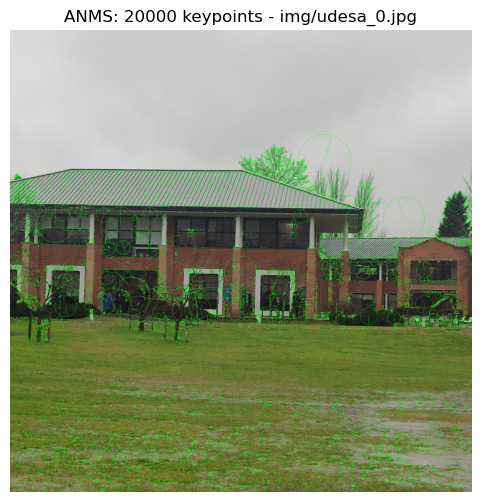

img/udesa_1.jpg: 14851 → 14851 (ANMS)


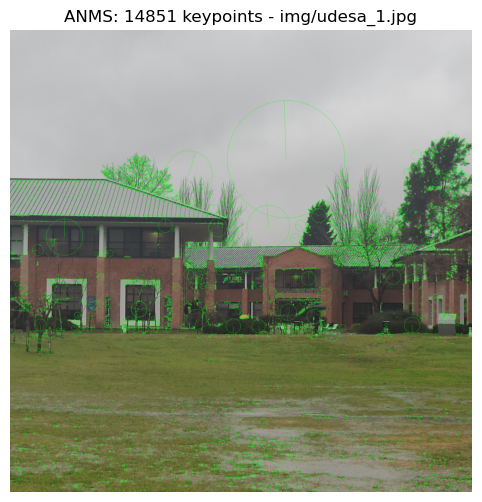

img/udesa_2.jpg: 5364 → 5364 (ANMS)


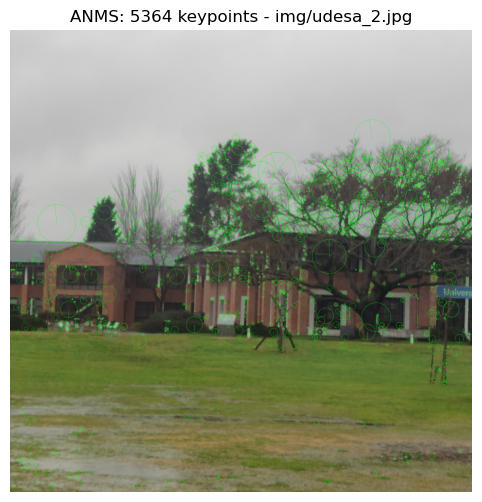

In [ ]:
for path in pathsU:
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kps, desc = sift.detectAndCompute(gray, None)

    N = 20000
    kps_anms, desc_anms = anms(kps, desc, N=N, strength_ratio=1.0)

    print(f"{path}: {len(kps)} → {len(kps_anms)} (ANMS)")

    vis = cv2.drawKeypoints(
        img, kps_anms, None,
        color=(0,255,0),  
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )

    plt.figure(figsize=(8,6))
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(f"ANMS: {len(kps_anms)} keypoints - {path}")
    plt.show()

## 3.3 - Asociación de características 

[A] img/udesa_0.jpg: 5000 → 1200 (ANMS)
[A] img/udesa_1.jpg: 5000 → 1200 (ANMS)
[A] img/udesa_2.jpg: 5000 → 1200 (ANMS)
[B] img/udesa_0.jpg: 6870 kp (mejorado)
[B] img/udesa_1.jpg: 7116 kp (mejorado)
[B] img/udesa_2.jpg: 6368 kp (mejorado)

================ PAR img/udesa_0.jpg ↔ img/udesa_1.jpg ================
>> Método A (baseline + ANMS)
   Cross-check: 368


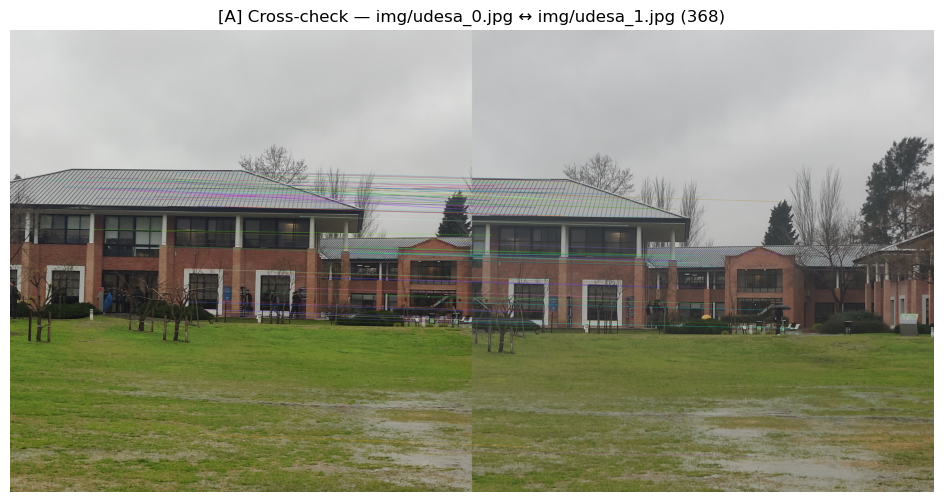

   Lowe ratio 0.75: 146


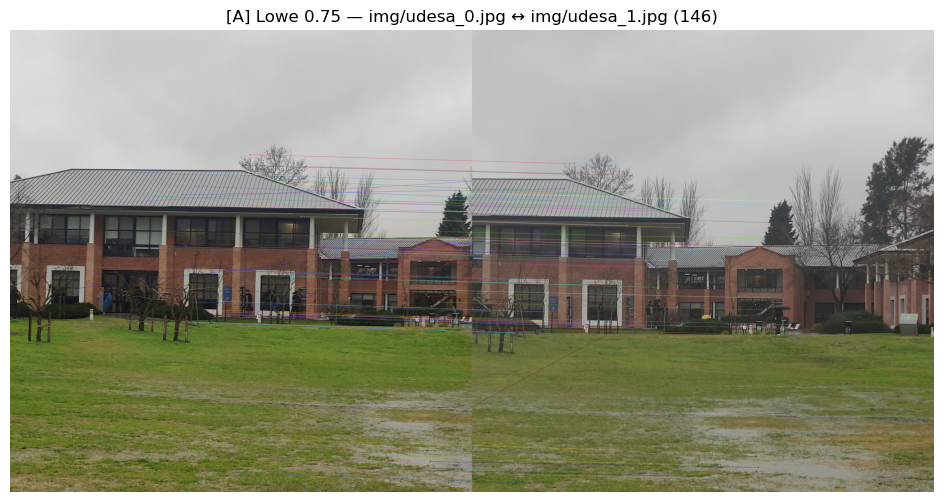

   Symmetric Lowe 0.8: 110
   RANSAC inliers [A]: 71/110 → 64.5%


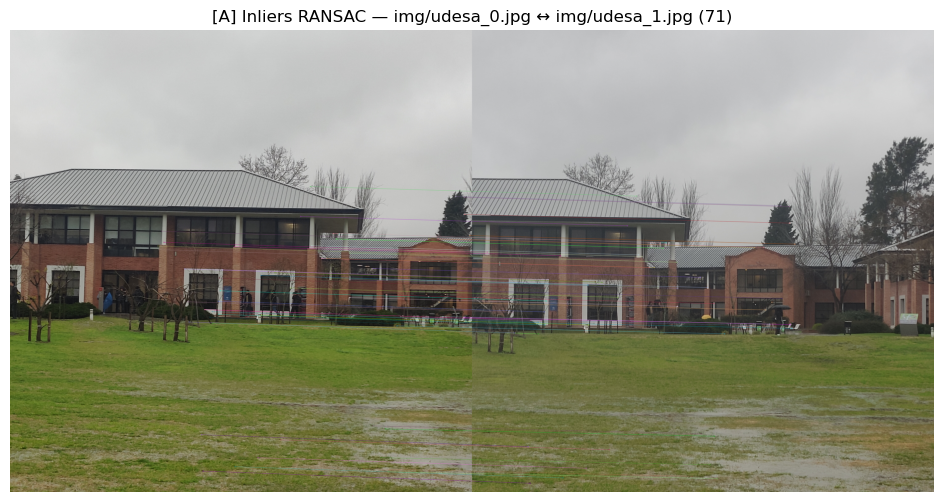

>> Método B (mejorado: CLAHE + máscara + SIFT sensible)
   Symmetric Lowe 0.8: 864
   RANSAC inliers [B]: 741/864 → 85.8%


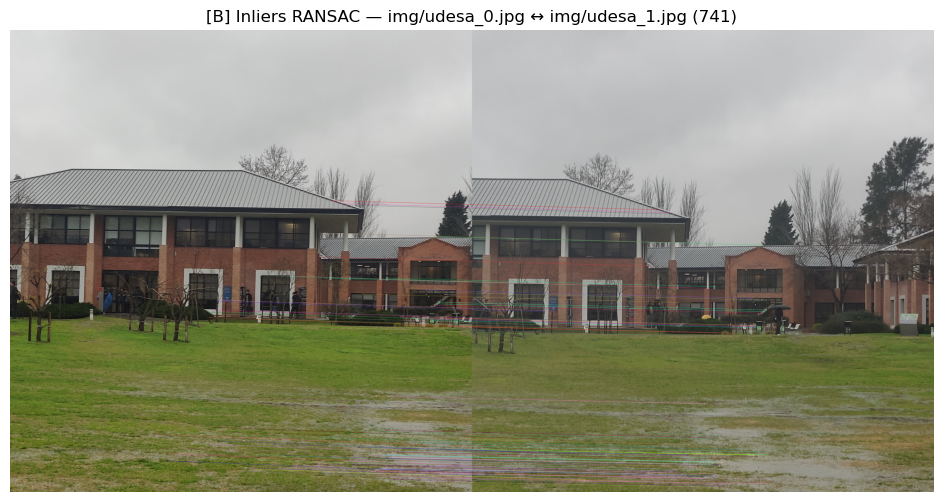


================ PAR img/udesa_2.jpg ↔ img/udesa_1.jpg ================
>> Método A (baseline + ANMS)
   Cross-check: 334


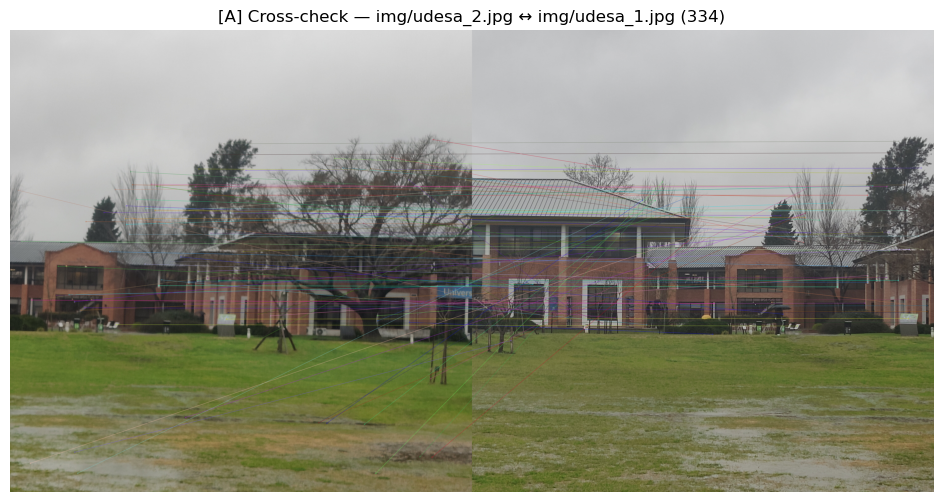

   Lowe ratio 0.75: 41


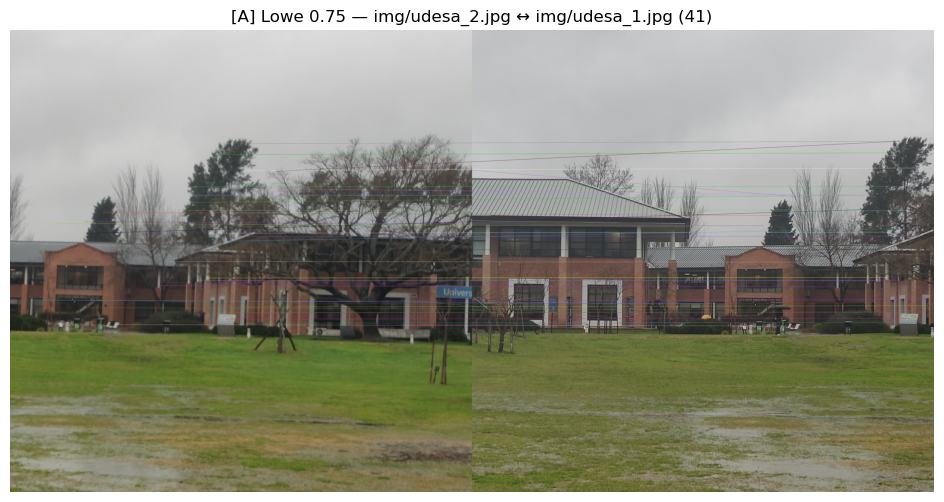

   Symmetric Lowe 0.8: 33
   RANSAC inliers [A]: 16/33 → 48.5%


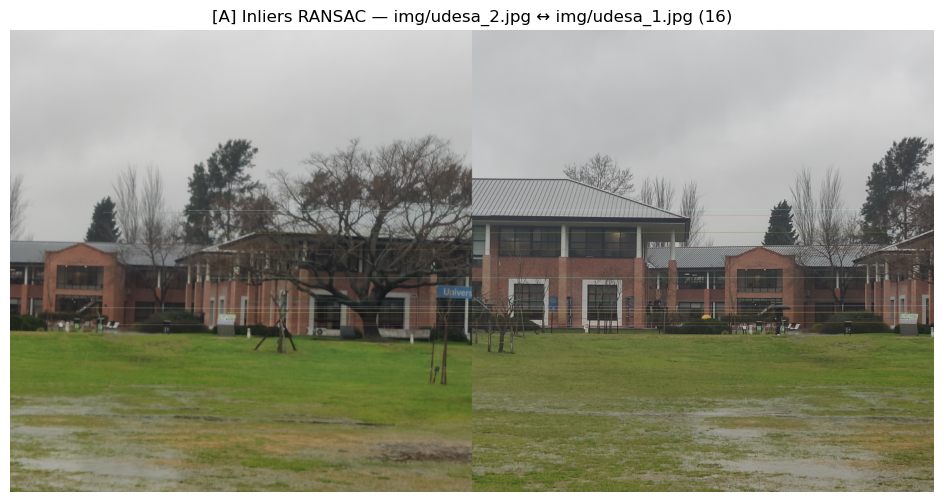

>> Método B (mejorado: CLAHE + máscara + SIFT sensible)
   Symmetric Lowe 0.8: 164
   RANSAC inliers [B]: 60/164 → 36.6%


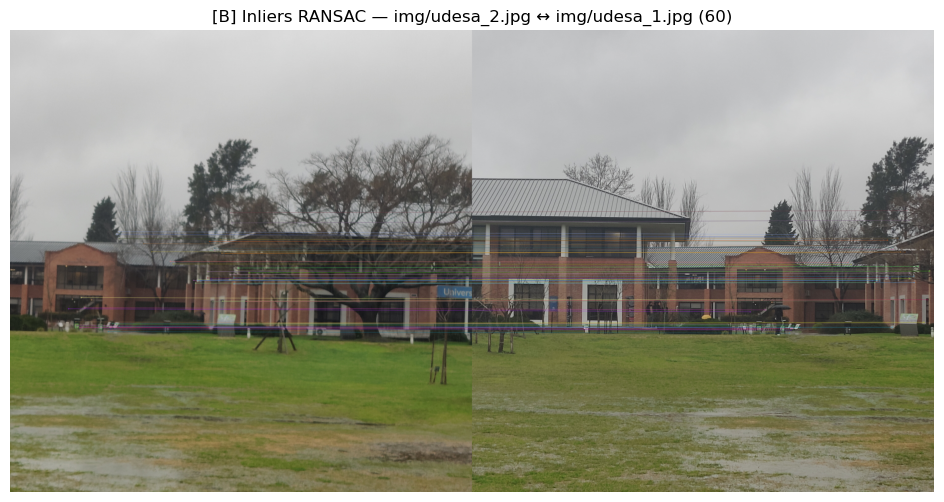

In [ ]:
# ================== CONFIG ==================
paths = ["img/udesa_0.jpg", "img/udesa_1.jpg", "img/udesa_2.jpg"]  # o cuadro_*
anchor_idx = 1
pairs = [(0, anchor_idx), (2, anchor_idx)]

# SIFT baseline y SIFT mejorado
sift_base = cv2.SIFT_create(nfeatures=5000)  # baseline
sift_plus = cv2.SIFT_create(nfeatures=8000, contrastThreshold=0.02, edgeThreshold=10)  # mejorado

# ================== MÉTODO A: BASELINE + ANMS ==================
imgsA, kpsA, descA = [], [], []
for p in paths:
    img = cv2.imread(p); imgsA.append(img)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, ds = sift_base.detectAndCompute(gray, None)

    # ANMS con N alto (para no quedarnos cortas en el solape)
    kp_anms, ds_anms = anms(kp, ds, N=1200, strength_ratio=1.0)
    kpsA.append(kp_anms); descA.append(ds_anms)
    print(f"[A] {p}: {len(kp)} → {len(kp_anms)} (ANMS)")

# ================== MÉTODO B: MEJORADO (CLAHE + máscara) ==================
imgsB, kpsB, descB = [], [], []
for p in paths:
    img = cv2.imread(p); imgsB.append(img)
    gray = to_gray_clahe(img)
    mask = sky_mask(img, top_frac=0.35)    # ajustá o poné None si molesta
    kp, ds = sift_plus.detectAndCompute(gray, mask)
    kpsB.append(kp); descB.append(ds)
    print(f"[B] {p}: {len(kp)} kp (mejorado)")

# ================== MATCHING Y MÉTRICAS ==================
for a,b in pairs:
    print(f"\n================ PAR {paths[a]} ↔ {paths[b]} ================")

    # --------- Método A (baseline) ---------
    print(">> Método A (baseline + ANMS)")
    # 1) BF cross-check puro
    bf_cc = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    ccA = bf_cc.match(descA[a], descA[b])
    print(f"   Cross-check: {len(ccA)}")
    if len(ccA) > 0:
        draw_matches(imgsA[a], kpsA[a], imgsA[b], kpsA[b], ccA,
                     title=f"[A] Cross-check — {paths[a]} ↔ {paths[b]} ({len(ccA)})", max_display=100)

    # 2) Lowe ratio 0.75 (1->2)
    bf = cv2.BFMatcher(cv2.NORM_L2)
    knn = bf.knnMatch(descA[a], descA[b], k=2)
    lrA = [m for m,n in knn if m.distance < 0.75*n.distance]
    print(f"   Lowe ratio 0.75: {len(lrA)}")
    if len(lrA) > 0:
        draw_matches(imgsA[a], kpsA[a], imgsA[b], kpsA[b], lrA,
                     title=f"[A] Lowe 0.75 — {paths[a]} ↔ {paths[b]} ({len(lrA)})", max_display=100)

    # 3) Lowe simétrico 0.8 + RANSAC (baseline)
    symA = symmetric_lowe(descA[a], descA[b], ratio=0.8)
    print(f"   Symmetric Lowe 0.8: {len(symA)}")
    H_A, inA, outA = ransac_inliers(kpsA[a], kpsA[b], symA, reproj_thresh=4.0)
    print(f"   RANSAC inliers [A]: {len(inA)}/{len(symA)} → { (100*len(inA)/max(1,len(symA))):.1f}%")
    if len(inA) > 0:
        draw_matches(imgsA[a], kpsA[a], imgsA[b], kpsA[b], inA,
                     title=f"[A] Inliers RANSAC — {paths[a]} ↔ {paths[b]} ({len(inA)})", max_display=120)

    # --------- Método B (mejorado) ---------
    print(">> Método B (mejorado: CLAHE + máscara + SIFT sensible)")
    symB = symmetric_lowe(descB[a], descB[b], ratio=0.8)
    print(f"   Symmetric Lowe 0.8: {len(symB)}")
    H_B, inB, outB = ransac_inliers(kpsB[a], kpsB[b], symB, reproj_thresh=4.0)
    print(f"   RANSAC inliers [B]: {len(inB)}/{len(symB)} → { (100*len(inB)/max(1,len(symB))):.1f}%")
    if len(inB) > 0:
        draw_matches(imgsB[a], kpsB[a], imgsB[b], kpsB[b], inB,
                     title=f"[B] Inliers RANSAC — {paths[a]} ↔ {paths[b]} ({len(inB)})", max_display=120)


[A] img/cuadro_0.jpg: 5000 → 1200 (ANMS)
[A] img/cuadro_1.jpg: 5000 → 1200 (ANMS)
[A] img/cuadro_2.jpg: 5000 → 1200 (ANMS)
[B] img/cuadro_0.jpg: 7577 kp (mejorado)
[B] img/cuadro_1.jpg: 7989 kp (mejorado)
[B] img/cuadro_2.jpg: 7975 kp (mejorado)

================ PAR img/cuadro_0.jpg ↔ img/cuadro_1.jpg ================
>> Método A (baseline + ANMS)
   Cross-check: 318


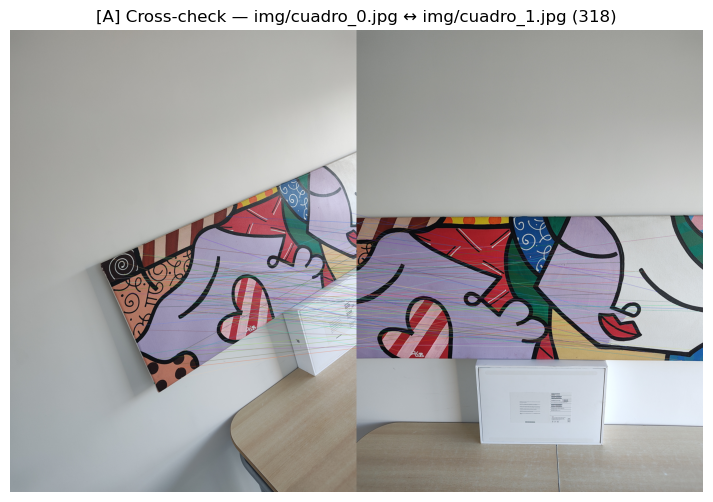

   Lowe ratio 0.75: 155


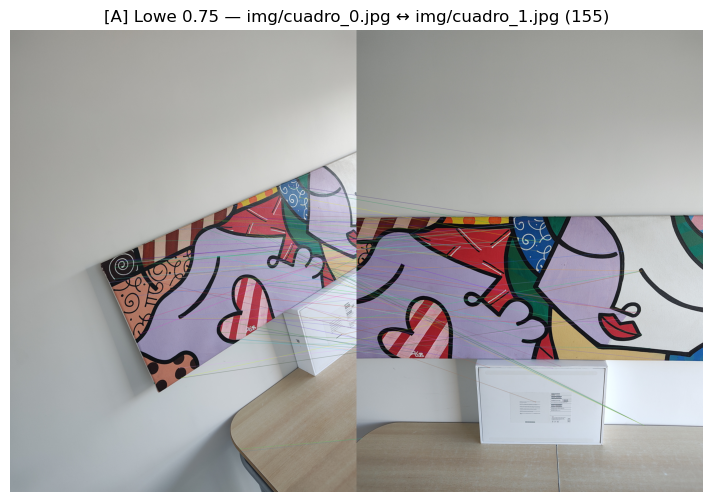

   Symmetric Lowe 0.8: 96
   RANSAC inliers [A]: 31/96 → 32.3%


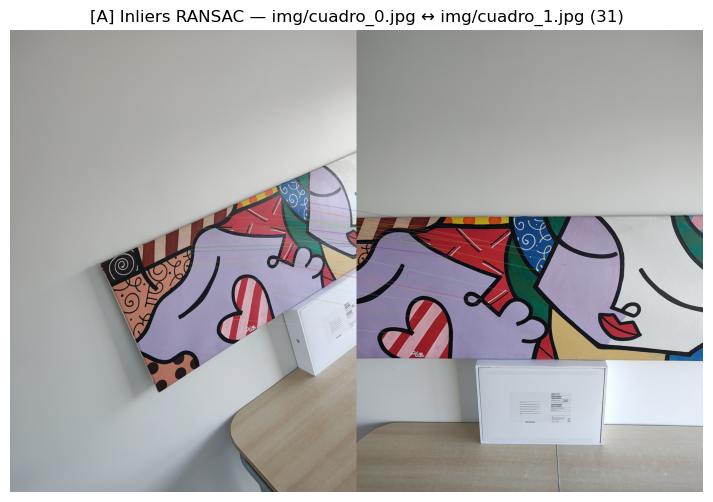

>> Método B (mejorado: CLAHE + máscara + SIFT sensible)
   Symmetric Lowe 0.8: 157
   RANSAC inliers [B]: 57/157 → 36.3%


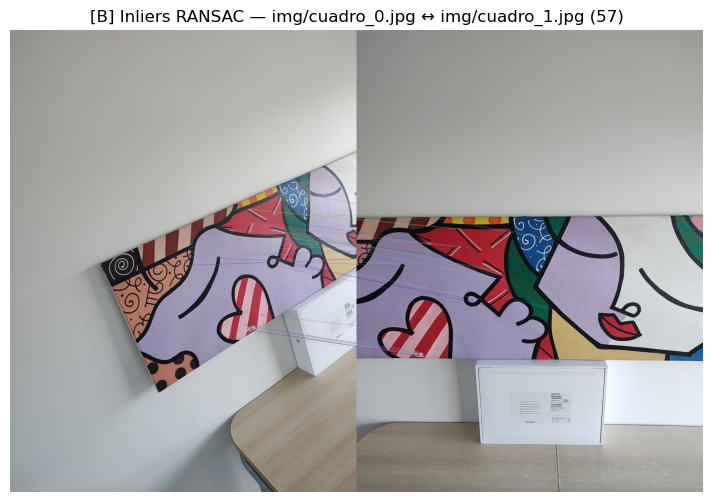


================ PAR img/cuadro_2.jpg ↔ img/cuadro_1.jpg ================
>> Método A (baseline + ANMS)
   Cross-check: 293


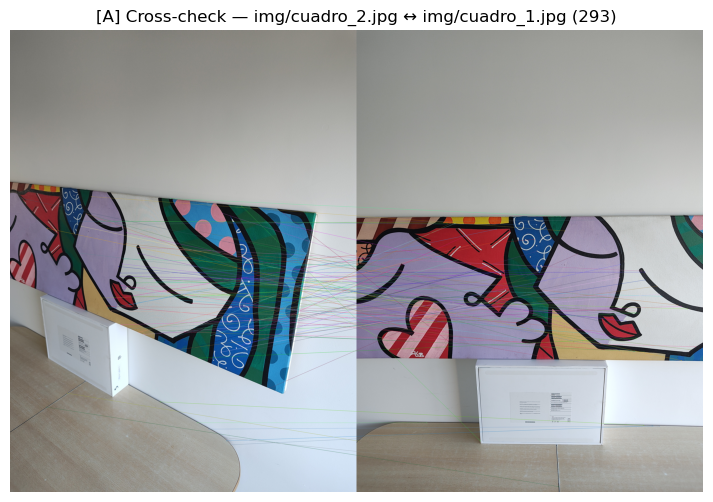

   Lowe ratio 0.75: 75


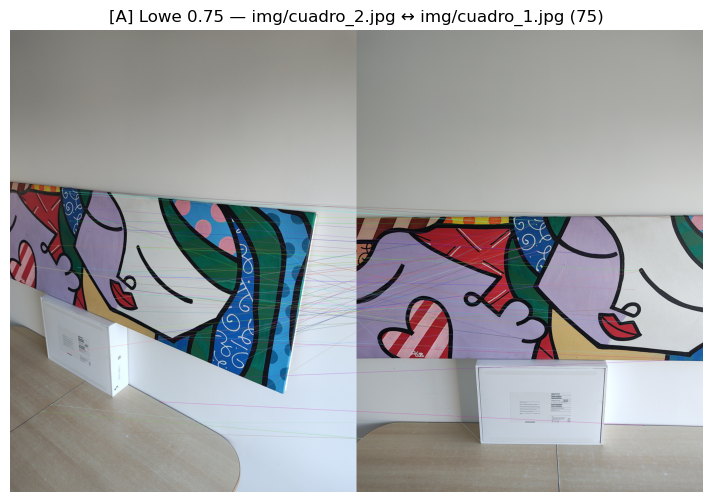

   Symmetric Lowe 0.8: 45
   RANSAC inliers [A]: 8/45 → 17.8%


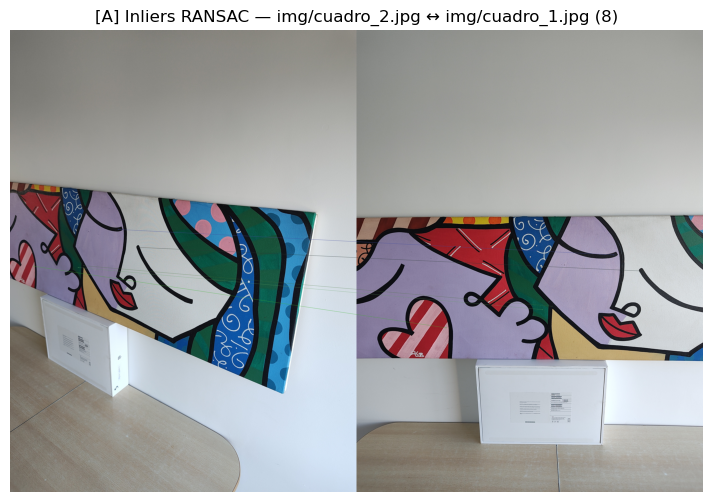

>> Método B (mejorado: CLAHE + máscara + SIFT sensible)
   Symmetric Lowe 0.8: 72
   RANSAC inliers [B]: 9/72 → 12.5%


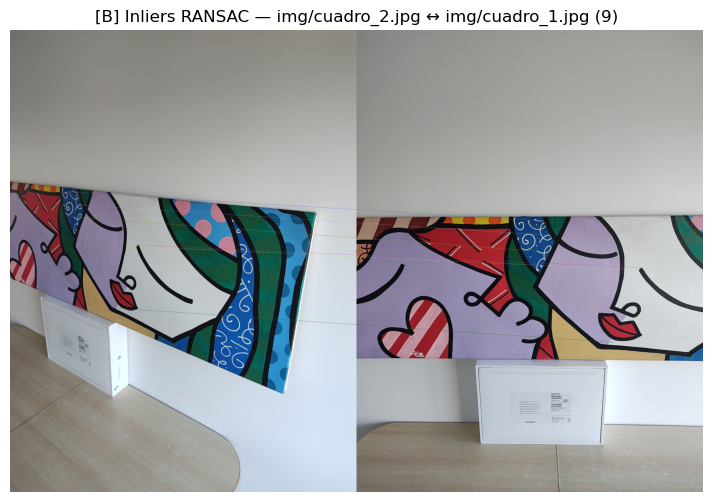

In [ ]:
# ================== CONFIG ==================
paths = ["img/cuadro_0.jpg", "img/cuadro_1.jpg", "img/cuadro_2.jpg"]  # o cuadro_*
anchor_idx = 1
pairs = [(0, anchor_idx), (2, anchor_idx)]

# SIFT baseline y SIFT mejorado
sift_base = cv2.SIFT_create(nfeatures=5000)  # baseline
sift_plus = cv2.SIFT_create(nfeatures=8000, contrastThreshold=0.02, edgeThreshold=10)  # mejorado

# ================== MÉTODO A: BASELINE + ANMS ==================
imgsA, kpsA, descA = [], [], []
for p in paths:
    img = cv2.imread(p); imgsA.append(img)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, ds = sift_base.detectAndCompute(gray, None)

    # ANMS con N alto (para no quedarnos cortas en el solape)
    kp_anms, ds_anms = anms(kp, ds, N=1200, strength_ratio=1.0)
    kpsA.append(kp_anms); descA.append(ds_anms)
    print(f"[A] {p}: {len(kp)} → {len(kp_anms)} (ANMS)")

# ================== MÉTODO B: MEJORADO (CLAHE + máscara) ==================
imgsB, kpsB, descB = [], [], []
for p in paths:
    img = cv2.imread(p); imgsB.append(img)
    gray = to_gray_clahe(img)
    mask = sky_mask(img, top_frac=0.35)    # ajustá o poné None si molesta
    kp, ds = sift_plus.detectAndCompute(gray, mask)
    kpsB.append(kp); descB.append(ds)
    print(f"[B] {p}: {len(kp)} kp (mejorado)")

# ================== MATCHING Y MÉTRICAS ==================
for a,b in pairs:
    print(f"\n================ PAR {paths[a]} ↔ {paths[b]} ================")

    # --------- Método A (baseline) ---------
    print(">> Método A (baseline + ANMS)")
    # 1) BF cross-check puro
    bf_cc = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    ccA = bf_cc.match(descA[a], descA[b])
    print(f"   Cross-check: {len(ccA)}")
    if len(ccA) > 0:
        draw_matches(imgsA[a], kpsA[a], imgsA[b], kpsA[b], ccA,
                     title=f"[A] Cross-check — {paths[a]} ↔ {paths[b]} ({len(ccA)})", max_display=100)

    # 2) Lowe ratio 0.75 (1->2)
    bf = cv2.BFMatcher(cv2.NORM_L2)
    knn = bf.knnMatch(descA[a], descA[b], k=2)
    lrA = [m for m,n in knn if m.distance < 0.75*n.distance]
    print(f"   Lowe ratio 0.75: {len(lrA)}")
    if len(lrA) > 0:
        draw_matches(imgsA[a], kpsA[a], imgsA[b], kpsA[b], lrA,
                     title=f"[A] Lowe 0.75 — {paths[a]} ↔ {paths[b]} ({len(lrA)})", max_display=100)

    # 3) Lowe simétrico 0.8 + RANSAC (baseline)
    symA = symmetric_lowe(descA[a], descA[b], ratio=0.8)
    print(f"   Symmetric Lowe 0.8: {len(symA)}")
    H_A, inA, outA = ransac_inliers(kpsA[a], kpsA[b], symA, reproj_thresh=4.0)
    print(f"   RANSAC inliers [A]: {len(inA)}/{len(symA)} → { (100*len(inA)/max(1,len(symA))):.1f}%")
    if len(inA) > 0:
        draw_matches(imgsA[a], kpsA[a], imgsA[b], kpsA[b], inA,
                     title=f"[A] Inliers RANSAC — {paths[a]} ↔ {paths[b]} ({len(inA)})", max_display=120)

    # --------- Método B (mejorado) ---------
    print(">> Método B (mejorado: CLAHE + máscara + SIFT sensible)")
    symB = symmetric_lowe(descB[a], descB[b], ratio=0.8)
    print(f"   Symmetric Lowe 0.8: {len(symB)}")
    H_B, inB, outB = ransac_inliers(kpsB[a], kpsB[b], symB, reproj_thresh=4.0)
    print(f"   RANSAC inliers [B]: {len(inB)}/{len(symB)} → { (100*len(inB)/max(1,len(symB))):.1f}%")
    if len(inB) > 0:
        draw_matches(imgsB[a], kpsB[a], imgsB[b], kpsB[b], inB,
                     title=f"[B] Inliers RANSAC — {paths[a]} ↔ {paths[b]} ({len(inB)})", max_display=120)
